In [100]:
import pandas as pd
import numpy as np
import anndata as ad
from random import sample
from math import ceil
from sklearn.preprocessing import minmax_scale
import matplotlib.pyplot as plt
from SpatialDE import spatial_patterns, SpatialPatternParameters

In [101]:
### single-cell eQTL effects

In [102]:
filename = "/nfs/leia/research/stegle/acuomo/singlecell_endodiff/data/pipeline_snakemakes/output_structlmm_alldays_10PCs/eqtl_tot_genetic_effect_all.txt"
df = pd.read_csv(filename, sep = "\t", index_col=0)
df.head()

,ENSG00000176125_UFSP1-7_100492322_C_T,ENSG00000175106_TVP23C-17_15478507_G_C,ENSG00000147677_EIF3H-8_117688031_G_A,ENSG00000204389_HSPA1A-6_31761865_T_C,ENSG00000204389_HSPA1A-6_31785228_G_C,ENSG00000116731_PRDM2-1_14235022_G_A,ENSG00000203485_INF2-14_105216381_C_T,ENSG00000091317_CMTM6-3_32523777_T_C,ENSG00000126524_SBDS-7_66440718_A_G,ENSG00000144134_RABL2A-2_114406459_G_A,...,ENSG00000206535_LNP1-3_100055273_G_A,ENSG00000206535_LNP1-3_100060779_C_T,ENSG00000206535_LNP1-3_100181999_G_T,ENSG00000143971_ETAA1-2_67712034_T_G,ENSG00000054277_OPN3-1_241892235_T_C,ENSG00000069667_RORA-15_61467734_T_C,ENSG00000173894_CBX2-17_77814533_G_A,ENSG00000164930_FZD6-8_104312432_A_G,ENSG00000164930_FZD6-8_104317011_A_G,ENSG00000164930_FZD6-8_104345778_A_G
21843_1#99,-0.092291,-0.020901,-0.054118,-0.617919,-0.654549,-0.013270,-0.185045,0.150489,-0.064830,0.041793,...,-0.039099,-0.142666,-0.091894,-0.094953,-0.080701,-0.067996,0.026881,-0.202234,-0.197769,-0.203371
24229_5#47,-0.094179,-0.418200,0.039307,-1.340217,-1.205610,-0.028206,-0.306860,0.050959,-0.089726,0.208231,...,-0.061028,-0.100131,-0.267392,-0.111616,-0.015448,-0.110905,0.030413,-0.006998,0.006067,-0.068799
25535_2#136,-0.080449,-0.044425,-0.047899,-0.879945,-0.889774,0.008512,-0.163487,0.146643,-0.030945,0.042243,...,-0.106094,-0.148331,-0.133007,-0.088487,-0.088059,-0.050601,0.009392,-0.249793,-0.244262,-0.224866
23794_1#233,-0.091711,-0.042417,-0.120662,-0.429285,-0.449291,-0.049670,-0.173315,0.185699,-0.005271,0.036158,...,-0.139418,-0.191834,-0.090162,-0.129926,-0.137495,-0.043284,0.043521,-0.317619,-0.326827,-0.264026
25475_3#27,-0.089183,-0.029810,-0.100041,-0.405588,-0.401307,-0.033448,-0.225870,0.170078,-0.069707,0.007676,...,-0.225352,-0.196503,-0.158505,-0.112523,-0.072948,-0.041999,0.088213,-0.265396,-0.300596,-0.242712


In [103]:
### PC coordinates

In [104]:
pcs_filename = "/hps/nobackup/stegle/users/acuomo/all_scripts/struct_LMM2/sc_endodiff/10pcs_500hvgs.csv"
df_pcs = pd.read_csv(pcs_filename, index_col=0)
df_pcs.head()
df_pcs.index

Index(['21843_1#10', '21843_1#100', '21843_1#101', '21843_1#102',
       '21843_1#103', '21843_1#105', '21843_1#106', '21843_1#107',
       '21843_1#108', '21843_1#109',
       ...
       '24539_8#88', '24539_8#89', '24539_8#90', '24539_8#91', '24539_8#92',
       '24539_8#93', '24539_8#94', '24539_8#95', '24539_8#97', '24539_8#98'],
      dtype='object', length=36044)

In [105]:
### build "fake" AnnData file
#
# counts: single-cell eQTL effects
# adata.obsm['spatial']: coordinates (PCA, UMAP..)

In [106]:
all_cells = df_pcs.index.values

In [107]:
# ceil(len(all_cells)*0.1)

In [108]:
all_cells

array(['21843_1#10', '21843_1#100', '21843_1#101', ..., '24539_8#95',
       '24539_8#97', '24539_8#98'], dtype=object)

In [109]:
cells = sample(list(all_cells), k = ceil(len(all_cells)*0.1))
cells = sorted(set(list(df.index.values)).intersection(cells))

In [110]:
df = df[df.index.isin(cells)]
df.shape

(3370, 4062)

In [111]:
# take absolute values and scale
df = df.abs()
mat = minmax_scale(df)
df = pd.DataFrame(data = mat, index = df.index, columns = df.columns)

In [112]:
df = df.loc[:, (df != 0).any(axis=0)]

In [113]:
df_pcs = df_pcs[df_pcs.index.isin(cells)]
df_pcs.shape

(3370, 10)

In [114]:
df = df.sort_index(axis=0)
df_pcs = df_pcs.sort_index(axis=0)

In [115]:
obs_names = df.index.values
obs = pd.DataFrame(index=obs_names)
# obs
n_obs = len(obs)
n_obs

3370

In [116]:
var_names = df.columns.values
var = pd.DataFrame(index=var_names)
# var
n_vars = len(var)
n_vars

4059

In [117]:
X = df.to_numpy()
X.shape
type(X)

numpy.ndarray

In [118]:
adata = ad.AnnData(X=X, obs=obs, var=var, dtype='float')
adata

AnnData object with n_obs × n_vars = 3370 × 4059

In [119]:
df_pcs.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10
21241_6#114,27.932193,11.971245,10.162364,-15.903409,-20.514675,-3.204534,-3.653567,5.775509,-6.878778,4.751411
21241_6#121,24.372714,2.880625,6.119623,-8.515696,-0.163914,-12.226158,-11.869531,7.233198,-0.638858,4.911983
21241_6#135,32.864959,1.711011,2.007057,-14.731184,4.787884,-7.910533,-7.365185,1.665785,4.868065,1.589929
21241_6#147,25.035276,11.674091,-3.656392,-12.629787,-10.339699,-9.544705,-5.885242,12.162655,-2.790599,2.429846
21241_6#157,24.964862,1.439752,5.390871,-11.723498,-4.420756,-12.700065,-12.960963,10.377718,-4.575483,7.778123


In [120]:
adata.obsm['spatial'] = df_pcs
# adata.obsm['spatial'] = df_pcs.to_numpy()

In [121]:
# adata
adata.obsm['spatial'].shape

(3370, 10)

In [122]:
adata

AnnData object with n_obs × n_vars = 3370 × 4059
    obsm: 'spatial'

In [127]:
adata.write("/hps/nobackup/stegle/users/acuomo/all_scripts/struct_LMM2/sc_endodiff/new/effect_sizes_clustering/scaled_absolute_old_eff_sizes_10pcs_as_spatial_downsample_10pct.h5")

In [124]:
### run SpatialDE to identify clusters

In [125]:
sp = spatial_patterns(adata, normalized = True, params=SpatialPatternParameters(lengthscales=5))

In [126]:
sp

(SpatialPatterns(converged=True, status='CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL', labels=array([23, 39, 20, ..., 20, 20, 16]), pattern_probabilities=array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]), patterns=array([[ 0.62865341, -0.26784829,  0.47167073, ...,  0.16896022,
          0.56286348,  0.14602284],
        [-0.06060494, -0.00976162,  0.58394843, ..., -0.73444782,
          1.57340816,  0.16857861],
        [-0.09022888, -0.3885667 ,  0.79979463, ..., -0.39831794,
          1.03960416, -0.00712135],
        ...,
        [ 0.52802402,  2.67661646, -1.26939318, ..., -0.52600836,
          1.08236413,  1.25481998],
        [ 0.08421018, -0.39130342,  0.83215153, ...,  0.04339092,
          0.46399552, -0.39809461],
        [ 0.94304117, -0.44229598,  0.69096377, ...,  0.290724

In [152]:
np.unique(sp[0].labels)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58])

In [168]:
sp[0].patterns.shape

(3370, 59)

In [157]:
np.unique(sp[0].pattern_probabilities)

array([0., 1.])

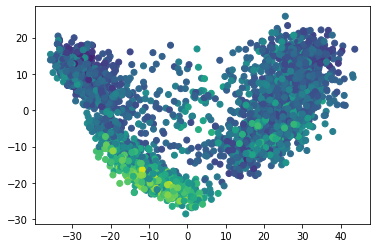

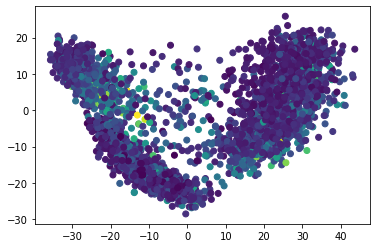

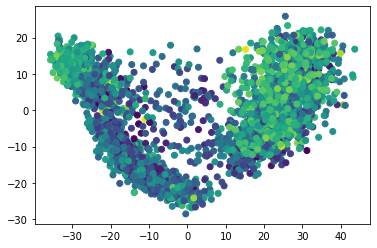

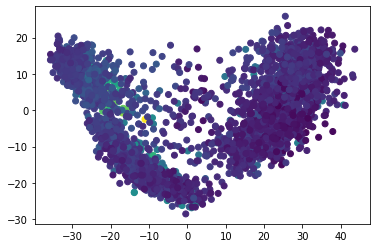

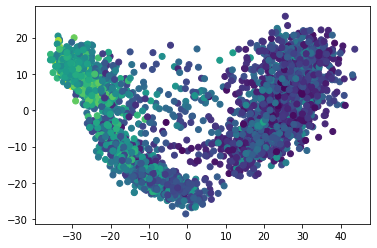

...

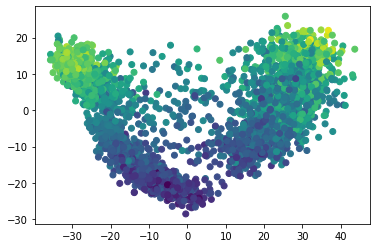

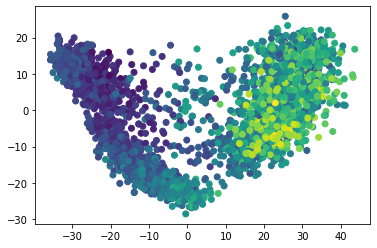

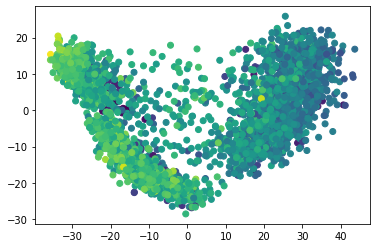

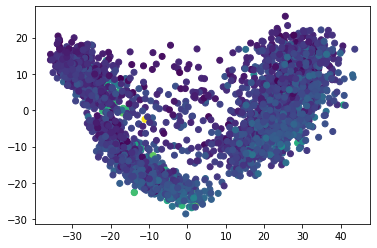

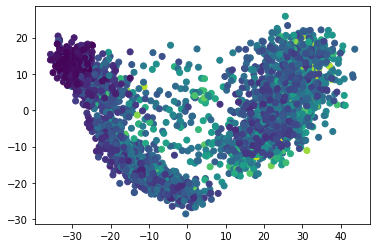

In [175]:
for i in np.arange(sp[0].patterns.shape[1]):
    plt.scatter(df_pcs.values[:,0],df_pcs.values[:,1], c = sp[0].patterns[:,i])
    plt.show()

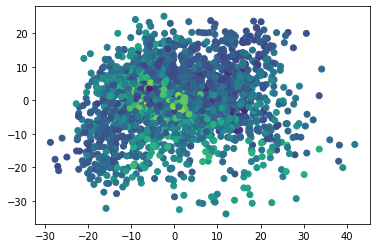

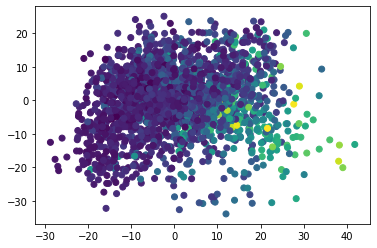

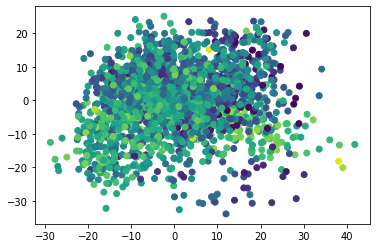

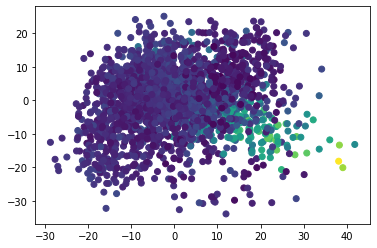

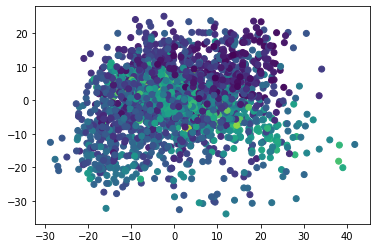

...

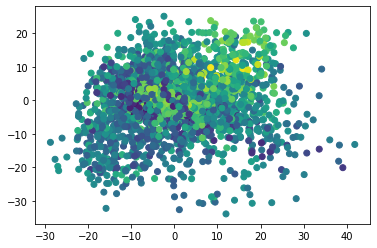

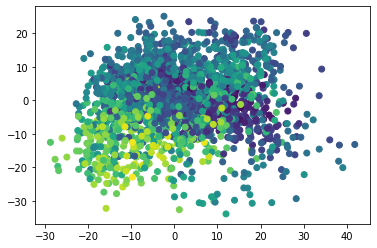

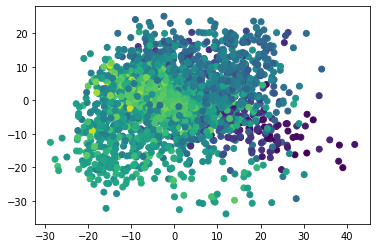

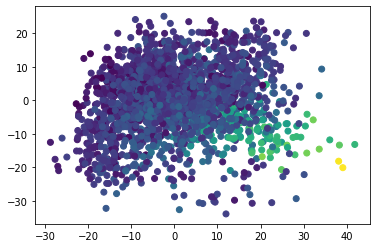

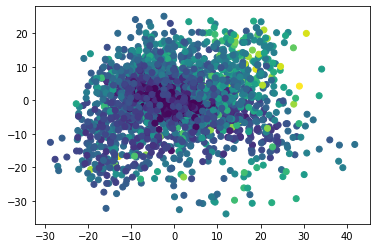

In [177]:
for i in np.arange(sp[0].patterns.shape[1]):
    plt.scatter(df_pcs.values[:,2],df_pcs.values[:,3], c = sp[0].patterns[:,i])
    plt.show()